## Imports

In [ ]:
import tensorflow as tf
import pathlib
import collections
import matplotlib.pyplot as plt
plt.style.use('ggplot')
import re
import string
import numpy as np
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.applications.vgg19 import preprocess_input

IMAGE_SHAPE = (224,224,3)

## Data handling

In [ ]:
def flickr8k_dataset(path='flickr8k'):
    path = pathlib.Path(path)

    # Download the Flickr8k dataset if not already present
    if len(list(path.rglob('*'))) < 16197:
        tf.keras.utils.get_file(
            origin='https://github.com/jbrownlee/Datasets/releases/download/Flickr8k/Flickr8k_Dataset.zip',
            cache_dir='.',
            cache_subdir=path,
            extract=True)
        tf.keras.utils.get_file(
            origin='https://github.com/jbrownlee/Datasets/releases/download/Flickr8k/Flickr8k_text.zip',
            cache_dir='.',
            cache_subdir=path,
            extract=True)

    # Read and preprocess captions
    captions = (path/"Flickr8k.token.txt").read_text().splitlines()
    captions = (line.split('\t') for line in captions)
    captions = ((fname.split('#')[0], caption) for (fname, caption) in captions)

    cap_dict = collections.defaultdict(list)
    for fname, cap in captions:
        cap_dict[fname].append(cap)

    # Read train and test files
    train_files = (path/'Flickr_8k.trainImages.txt').read_text().splitlines()
    train_captions = [(str(path/'Flicker8k_Dataset'/fname), cap_dict[fname]) for fname in train_files]

    test_files = (path/'Flickr_8k.testImages.txt').read_text().splitlines()
    test_captions = [(str(path/'Flicker8k_Dataset'/fname), cap_dict[fname]) for fname in test_files]

    return train_captions,test_captions

# Example usage:
train_dataset, test_dataset = flickr8k_dataset()

2340801/2340801 [==============================] - 0s 0us/step


In [ ]:
image_paths, captions_list = zip(*train_dataset)
image_paths_flat = [path for path, captions in zip(image_paths, captions_list) for _ in captions]
captions_flat = [caption for captions in captions_list for caption in captions]
len(image_paths_flat),len(captions_flat)

(30000, 30000)

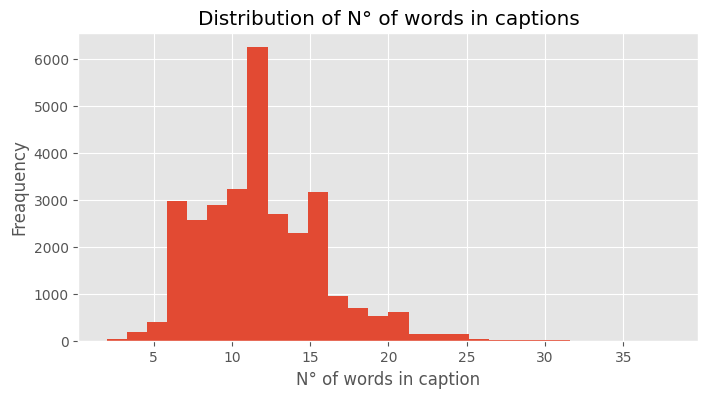

In [ ]:
plt.figure(figsize=(8,4))
plt.hist([len(x.split()) for x in captions_flat],bins=28)
plt.xlabel('N° of words in caption')
plt.ylabel('Freaquency')
plt.title('Distribution of N° of words in captions')
plt.show()

In [ ]:
def standardize(s):
  s = tf.strings.lower(s)
  s = tf.strings.regex_replace(s, f'[{re.escape(string.punctuation)}]', '')
  s = tf.strings.join(['[START]', s, '[END]'], separator=' ')
  return s
def process_caption(img,txt):
  return img,standardize(txt)

In [ ]:
dataset = tf.data.Dataset.from_tensor_slices((image_paths_flat, captions_flat))
ds = dataset.map(process_caption)

In [ ]:
for example in ds.take(3):
  img_path,caption = example
  print(img_path)
  print(caption)
  print()

tf.Tensor(b'flickr8k/Flicker8k_Dataset/2513260012_03d33305cf.jpg', shape=(), dtype=string)
tf.Tensor(b'[START] a black dog is running after a white dog in the snow  [END]', shape=(), dtype=string)

tf.Tensor(b'flickr8k/Flicker8k_Dataset/2513260012_03d33305cf.jpg', shape=(), dtype=string)
tf.Tensor(b'[START] black dog chasing brown dog through snow [END]', shape=(), dtype=string)

tf.Tensor(b'flickr8k/Flicker8k_Dataset/2513260012_03d33305cf.jpg', shape=(), dtype=string)
tf.Tensor(b'[START] two dogs chase each other across the snowy ground  [END]', shape=(), dtype=string)



In [ ]:
vocab_size = 5000
tokenizer = tf.keras.layers.TextVectorization(
    max_tokens=vocab_size,
    standardize = None,
    ragged=True)
tokenizer.adapt(ds.map(lambda fp,txt: txt))
tokenizer.get_vocabulary()[:10]

['', '[UNK]', 'a', '[START]', '[END]', 'in', 'the', 'on', 'is', 'and']

In [ ]:
print(caption)
t = tokenizer(caption)
t

tf.Tensor(b'[START] two dogs chase each other across the snowy ground  [END]', shape=(), dtype=string)


<tf.Tensor: shape=(11,), dtype=int64, numpy=array([  3,  14,  32, 834, 140,  85, 128,   6, 139, 166,   4])>

In [ ]:
word_to_index = tf.keras.layers.StringLookup(
    mask_token="",
    vocabulary=tokenizer.get_vocabulary())
index_to_word = tf.keras.layers.StringLookup(
    mask_token="",
    vocabulary=tokenizer.get_vocabulary(),
    invert=True)

w = index_to_word(t)
tf.strings.reduce_join(w, separator=' ', axis=-1).numpy().decode('UTF-8')

'[START] two dogs chase each other across the snowy ground [END]'

In [ ]:
def prepare_tokens(imgs, txts):
  tokens = tokenizer(txts)
  input_tokens = tokens[..., :-1]
  label_tokens = tokens[..., 1:]
  return (imgs, input_tokens), label_tokens

In [ ]:
def load_image(example,caption_shifted_right):
    image_path,caption = example
    img = tf.io.read_file(image_path)
    img = tf.io.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, IMAGE_SHAPE[:-1])
    return (img,caption),caption_shifted_right

## EDA

In [ ]:
from collections import Counter
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [ ]:
tokenizer_vocab = tokenizer.get_vocabulary()
tokenized_words = [word for sentence in captions_flat for word in sentence.split() if word in tokenizer_vocab]
word_frequencies = Counter(tokenized_words)
print(word_frequencies)

Counter({'a': 29930, 'in': 14077, 'the': 11283, 'on': 7997, 'is': 6907, 'and': 6671, 'dog': 6047, 'with': 5761, 'man': 5048, 'of': 4966, 'white': 2875, 'black': 2749, 'are': 2618, 'boy': 2530, 'woman': 2405, 'girl': 2331, 'to': 2303, 'wearing': 2270, 'at': 2096, 'water': 2019, 'red': 1967, 'brown': 1928, 'young': 1828, 'people': 1791, 'his': 1711, 'blue': 1660, 'running': 1588, 'dogs': 1585, 'through': 1533, 'playing': 1486, 'an': 1454, 'while': 1434, 'down': 1364, 'shirt': 1363, 'ball': 1335, 'standing': 1301, 'grass': 1222, 'snow': 1167, 'little': 1165, 'jumping': 1101, 'child': 1070, 'over': 1062, 'person': 1032, 'sitting': 1018, 'front': 996, 'field': 994, 'holding': 972, 'two': 961, 'yellow': 926, 'green': 918, 'by': 903, 'up': 903, 'small': 889, 'group': 879, 'walking': 870, 'her': 861, 'large': 860, 'men': 798, 'air': 769, 'into': 757, 'near': 750, 'mouth': 744, 'beach': 742, 'children': 728, 'jumps': 726, 'runs': 724, 'one': 712, 'another': 711, 'for': 706, 'from': 700, 'its': 

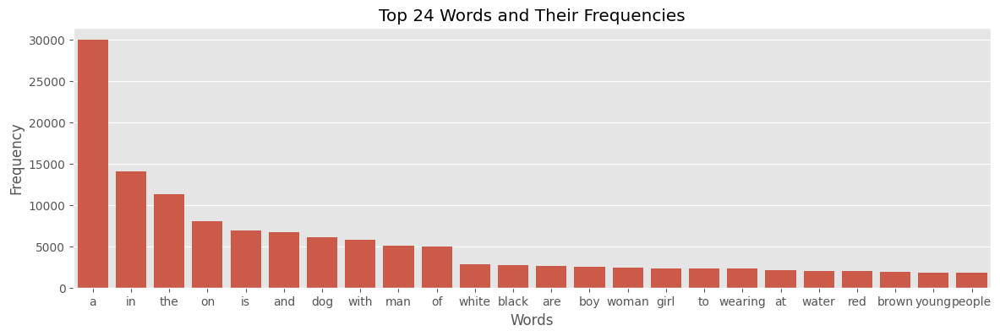

In [ ]:
# @title Word Frequencies
p = 24 # @param {type:"integer"}
top_words = [word for word, _ in word_frequencies.most_common(p)]
top_frequencies = [freq for _, freq in word_frequencies.most_common(p)]
plt.figure(figsize=(14,4))
sns.barplot(x=top_words, y=top_frequencies)
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.title(f'Top {p} Words and Their Frequencies')
plt.show()

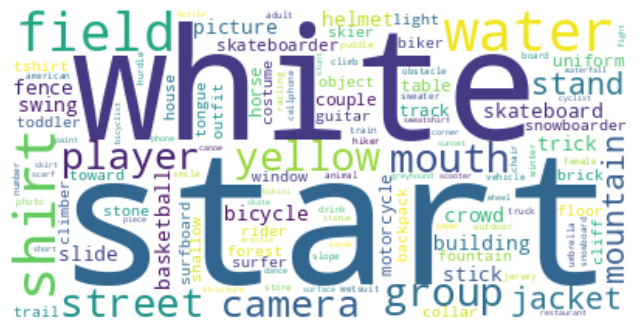

In [ ]:
# @title Word Cloud from vocab in the training set
text = ' '.join([word for word in tokenizer_vocab if len(word) >4])
stopwords = set(STOPWORDS)
stopwords.update(['UNK','[START]','END'])
wordcloud = WordCloud(stopwords=stopwords, background_color='white').generate(text)

# Display the generated image:
plt.figure(figsize=(8,6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

## Prepare Dataset

In [ ]:
def prepare_dataset(ds,tokenizer=tokenizer,batch_size=32,shuffle_buffer=1000 ,vocabulary_size = 5000):

  image_paths, captions_list = zip(*ds)
  image_paths_flat = [path for path, captions in zip(image_paths, captions_list) for _ in captions]
  captions_flat = [caption for captions in captions_list for caption in captions]

  # create dataset
  dataset = tf.data.Dataset.from_tensor_slices((image_paths_flat, captions_flat))
  dataset = dataset.map(process_caption,tf.data.AUTOTUNE)
  dataset = dataset.map(prepare_tokens,tf.data.AUTOTUNE)
  dataset = dataset.map(load_image,tf.data.AUTOTUNE)
  dataset = dataset.shuffle(1000)
  dataset = dataset.padded_batch(
    batch_size=batch_size,
    padded_shapes=(
        (tf.TensorShape((224, 224, 3)),
        tf.TensorShape([None])),
        tf.TensorShape([None])
    ),
    padding_values=((None, tf.constant(0, dtype=tf.int64)), tf.constant(0, dtype=tf.int64))
  )
  dataset = dataset.prefetch(tf.data.AUTOTUNE)
  return dataset


train_dataset, test_dataset = flickr8k_dataset()
train_dataset = prepare_dataset(train_dataset)
test_dataset = prepare_dataset(test_dataset)

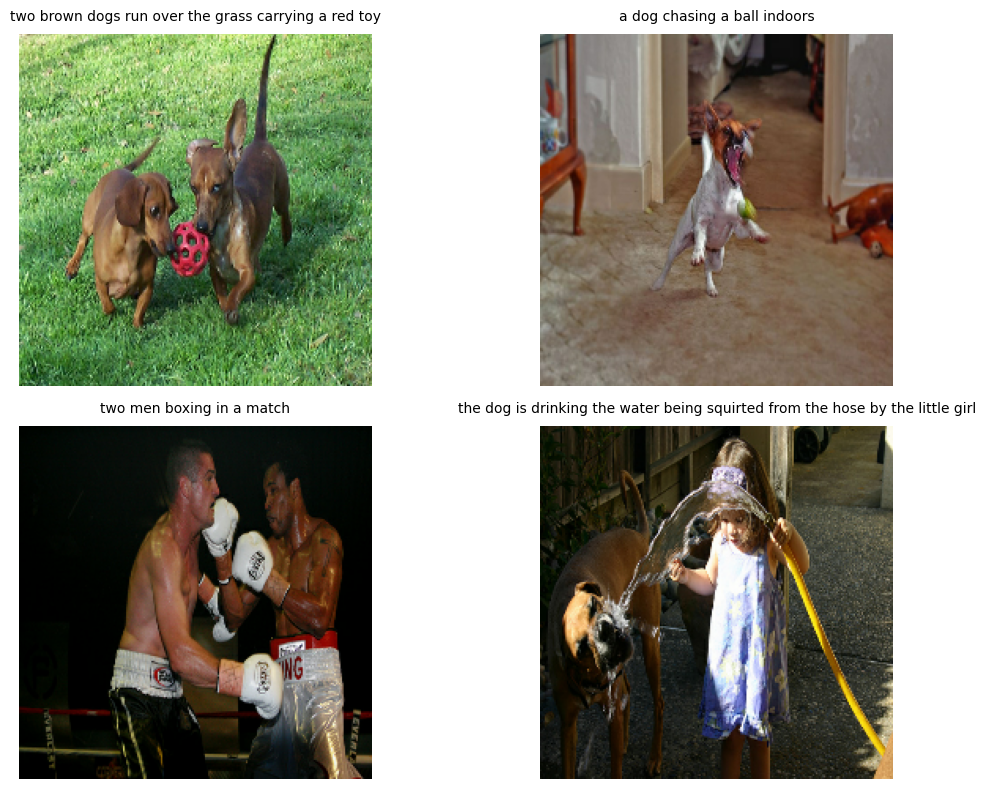

In [ ]:
# @title Show some images and their corresponding captions
imags = []
capts = []
for example in train_dataset.unbatch().take(4):
    (img,tokens), tokens_shifted_right = example
    img = img.numpy().astype('uint8')
    tokens = index_to_word(tokens)
    tokens = tokens[1:-1]
    tokens = tf.strings.reduce_join(tokens, separator=' ', axis=-1).numpy().decode('UTF-8')
    tokens = tokens.strip()
    tokens = tokens.replace('[END]','')

    capts.append(tokens)
    imags.append(img)

fig, axes = plt.subplots(2, 2, figsize=(12,8))
for i, (image, description) in enumerate(zip(imags, capts)):
    row, col = divmod(i, 2)

    axes[row, col].imshow(image)
    axes[row, col].axis('off')
    axes[row, col].set_title(description, fontsize=10, pad=10)

plt.tight_layout()
plt.show()

## Feature Extraction

In [ ]:
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.applications.vgg19 import preprocess_input
from PIL import Image

feature_extractor = VGG19(weights='imagenet', include_top=False,input_shape=(224,224,3))
feature_extractor = tf.keras.Model(inputs=feature_extractor.input,outputs=feature_extractor.layers[-2].output)
feature_extractor.trainable = False

80134624/80134624 [==============================] - 1s 0us/step


64400/64400 [==============================] - 0s 0us/step


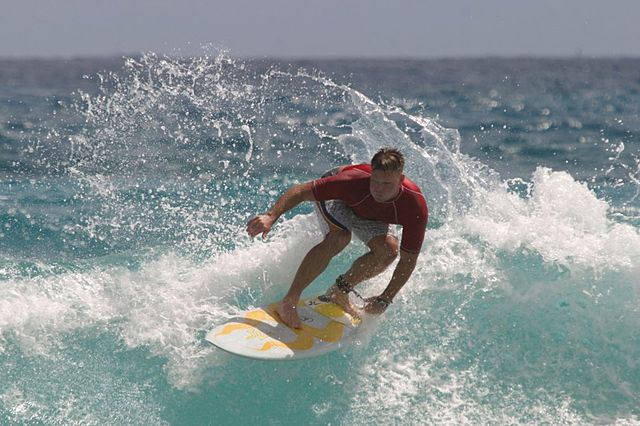

In [ ]:
image_url = 'https://tensorflow.org/images/surf.jpg'
image_path = tf.keras.utils.get_file('surf.jpg', origin=image_url)
Image.open(image_path)

In [ ]:
img = tf.io.read_file(image_path)
img = tf.io.decode_jpeg(img, channels=3)
img = tf.image.resize(img, IMAGE_SHAPE[:-1])
img = preprocess_input(img)
img = tf.expand_dims(img,axis=0)
feature_extractor(img).shape

TensorShape([1, 14, 14, 512])

## Transformer decoder model

In [ ]:
class PositionalEmbeddings(tf.keras.layers.Layer):
  def __init__(self,max_positions,d_model):
    """
     -> Computes the Positional encoding

     Arguments:
        max_positions (int): maximum number of positions to be encoded
        d_model (int): the embeddings size of each token

     Returns:
        pos_encoding (tf.Tensor): A matrix of shape (1,position,d_model)
    """
    super().__init__()
    self.max_positions = max_positions
    self.d_model = d_model

  def call(self,inputs=None):
    position = np.arange(self.max_positions)[:, np.newaxis]
    k = np.arange(self.d_model)[np.newaxis, :]
    i = k // 2
    angle_rates = 1 / np.power(10000, (2 * i) / np.float32(self.d_model))
    angle_rads = position * angle_rates
    angle_rads[:, 0::2] = np.sin(angle_rads[:, 0::2])
    angle_rads[:, 1::2] = np.cos(angle_rads[:, 1::2])
    pos_encoding = angle_rads[np.newaxis, ...]
    return tf.cast(pos_encoding, dtype=tf.float32)

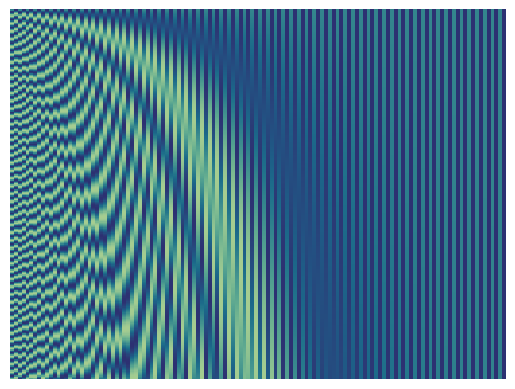

In [ ]:
positional_embeddings = PositionalEmbeddings(300,128)(inputs=None)
sns.heatmap(tf.squeeze(positional_embeddings),cmap="crest",xticklabels=False, yticklabels=False,cbar=False)
plt.show()

In [ ]:
class SeqEmbedding(tf.keras.layers.Layer):
  def __init__(self,vocab_size,d_model,max_positions):
    """
     -> Computes the Embeddings of target sequences

     Arguments:
        vocab_size (int): size of the vocabulary used for training
        d_model (int): size of the embeddings of each token
        max_positions (int): maximum number of positions to be encoded

    Returns:
        seq_embeddings (tf.Tensor): a tensor of shape (batch_size,seq_length,d_model)
    """
    super().__init__()
    self.vocab_size = vocab_size
    self.d_model = d_model
    self.max_positions = max_positions

    # self.pos_encoding = PositionalEmbeddings(self.max_positions,self.d_model)
    # self.pos_encoding_matrix = tf.squeeze(self.pos_encoding(inputs=None)).numpy()
    # self.pos_encoding = tf.keras.layers.Embedding(input_dim=50,
    #                                    output_dim=256,
    #                                    weights=[self.pos_encoding_matrix],
    #                                    trainable=False
    #                                             )

    self.pos_embedding = tf.keras.layers.Embedding(input_dim=self.max_positions,
                                                   output_dim=self.d_model)

    self.embeddings = tf.keras.layers.Embedding(input_dim=vocab_size,
                                                output_dim=d_model,
                                                mask_zero=True)
    self.add = tf.keras.layers.Add()

  def call(self,seq):
    """
      seq (tf.Tensor): a matrix of shape (batch_size,seq_len) containing tokens of captions
    """
    seq = self.embeddings(seq) # (batch, seq, depth)

    x = tf.range(tf.shape(seq)[1])  # (seq)
    x = x[tf.newaxis, :]  # (1, seq)
    x = self.pos_embedding(x)  # (1, seq, depth)

    return self.add([seq,x])

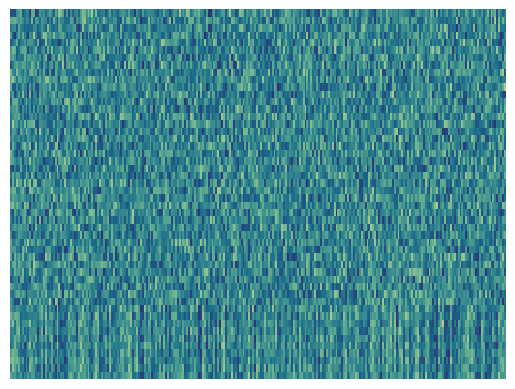

In [ ]:
# Dummy sequence (like the sequence)
seq = tf.concat([tf.random.uniform(shape=[1,40], minval=0, maxval=100, dtype=tf.int32),tf.zeros(shape=(1,10),dtype=tf.int32)],axis=-1)
seq_embed = SeqEmbedding(1000,256,50)(seq)
# Plot Embeddings
sns.heatmap(tf.squeeze(seq_embed),cmap="crest",xticklabels=False, yticklabels=False,cbar=False)
plt.show()

## Decoder

The decoder is a standard Transformer-decoder, it contains a stack of DecoderLayers where each contains three sublayers: a CausalSelfAttention, a CrossAttention, and a FeedForward

The `CausalSelfAttention` layer is below:



In [ ]:
class CausalSelfAttention(tf.keras.layers.Layer):
  """
   -> Computes the masked self attention of the input sentence (seq)

   Arguments:
      num_heads (int): num of heads used in the scaled dot product attention
      key_dims (int): the dimension of the key Matrix (as well as the Query Matrix) defaults to the d_model // num_heads
      dropout_rate (float): dropout rate used during training

   Returns:
      causal_attantion (tf.Tensor): the self attention of the input seq a Matrix of shape (batch_size,seq_len,d_model)
      (Optional) attention_weights (tf.Tensor): a Matrix of shape (batch_size,num_heads,seq_len,seq_len)
  """
  def __init__(self,num_heads, key_dims, dropout_rate=0.2):
    super().__init__()
    self.num_heads = num_heads
    self.key_dims = key_dims
    self.mha = tf.keras.layers.MultiHeadAttention(
        num_heads = self.num_heads,
        key_dim = self.key_dims,
        dropout = dropout_rate
    )
    self.add = tf.keras.layers.Add()
    self.layernorm = tf.keras.layers.LayerNormalization()

  def call(self,x,return_attention_weights=False):
    """
    Arguments:
        x (tf.Tensor): a Matrix of size (batch_size,seq_len,d_model)
        return_attention_weights (Bool): if True return the attention weights calulated
    """
    attn,attn_weights = self.mha(query=x, value=x,
                    use_causal_mask=True,return_attention_scores=True)
    x = self.add([x, attn])

    if return_attention_weights == False:
      return self.layernorm(x)
    return self.layernorm(x),attn_weights

self_attention shape: (1, 50, 256), attnetion weights shape: (1, 8, 50, 50)


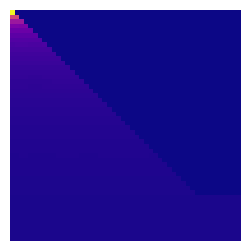

In [ ]:
# 8 Heads of Attention , d_model = 256 so key_dims = 32 (split embeddings on each head)
csa = CausalSelfAttention(num_heads=8, key_dims=32)
self_attn,attn_weights = csa(seq_embed,return_attention_weights=True)
print(f'self_attention shape: {self_attn.shape}, attnetion weights shape: {attn_weights.shape}')
attn_weights = tf.squeeze(tf.math.reduce_mean(attn_weights,axis=1)).numpy()

# Plot self attention weights
plt.figure(figsize=(3,3))
plt.imshow(attn_weights,cmap='plasma')
plt.axis('off')
plt.show()

The `CrossAttention` layer is below. Note the use of return_attention_scores.

In [ ]:
class CrossAttention(tf.keras.layers.Layer):
  """
   -> Computes the attention between the input sentence (seq) and the features extracted from the image (feature)

   Arguments:
      num_heads (int): num of heads used in the scaled dot product attention
      key_dims (int): the dimension of the key Matrix (as well as the Query Matrix) defaults to the d_model // num_heads
      value_dims (int): the dimension of the value Matrix
      dropout_rate (float): dropout rate used during training

   Returns:
      cross_attantion (tf.Tensor): the self attention of the input seq a Matrix of shape (batch_size,seq_len,d_model)
      (Optional) attention_weights (tf.Tensor): a Matrix of shape (batch_size,num_heads,seq_len,seq_len)
  """
  def __init__(self,num_heads, key_dims, value_dims, dropout_rate=0.2):
    super().__init__()
    self.num_heads = num_heads
    self.key_dims = key_dims
    self.value_dims = value_dims
    self.mha = tf.keras.layers.MultiHeadAttention(
        num_heads = self.num_heads,
        key_dim = self.key_dims,
        value_dim = self.value_dims,
        dropout = dropout_rate
    )
    self.add = tf.keras.layers.Add()
    self.layernorm = tf.keras.layers.LayerNormalization()

  def call(self,x,y):
    """
     x (tf.Tensor): a Matrix of size (batch_size,seq_len,d_model)
    """
    attn, attention_scores = self.mha(
             query=x, value=y,
             return_attention_scores=True)

    self.last_attention_scores = attention_scores

    x = self.add([x, attn])
    return self.layernorm(x)

In [ ]:
CA = CrossAttention(num_heads=1, key_dims=256, value_dims=256)
feature_map = tf.random.normal([1,196,512],dtype=tf.float32) # features from VGG19
# (batch_size,seq_embed=50,d_model=256)
cross_attention = CA(self_attn,feature_map)
cross_attention.shape,CA.last_attention_scores.shape

(TensorShape([1, 50, 256]), TensorShape([1, 1, 50, 196]))

In [ ]:
class FeedForward(tf.keras.layers.Layer):

  def __init__(self, units, dropout_rate=0.2):
    super().__init__()
    self.seq = tf.keras.Sequential([
        tf.keras.layers.Dense(units=2*units, activation='relu'),
        tf.keras.layers.Dense(units=units),
        tf.keras.layers.Dropout(rate=dropout_rate),
    ])

    self.layernorm = tf.keras.layers.LayerNormalization()

  def call(self, x):
    x = x + self.seq(x)
    return self.layernorm(x)

In [ ]:
FCN = FeedForward(units=256)
ffn_output = FCN(cross_attention)
ffn_output.shape

TensorShape([1, 50, 256])

In [ ]:
class DecoderLayer(tf.keras.layers.Layer):
  """
   Transformer Decoder Layer: computes the attention between the each token and the
   spatial blocks in the image

   Returns:

  """
  def __init__(self,key_dims=256, num_heads=1, dropout_rate=0.2):
    super().__init__()
    self.self_attention = CausalSelfAttention(8,
                                   key_dims//8,
                                   dropout_rate=dropout_rate)
    self.cross_attention = CrossAttention(1,
                             key_dims,
                             key_dims,
                             dropout_rate=dropout_rate)
    self.ff = FeedForward(key_dims,
                           dropout_rate=dropout_rate)


  def call(self, inputs, training=True):
    """
     seq (tf.Tensor): a Tuple containing 2 Matrix of shape (B,14*14,512) (the output of the VGG19),
                       (B,seq_len,d_model) the seq embeddings
    """

    in_seq, out_seq = inputs
    out_seq = self.self_attention(out_seq)
    out_seq = self.cross_attention(out_seq, in_seq)
    self.last_attention_scores = self.cross_attention.last_attention_scores
    out_seq = self.ff(out_seq)
    return out_seq

In [ ]:
dec_layer = DecoderLayer()
dec_output = dec_layer(inputs=(feature_map,seq_embed))
dec_output.shape,dec_layer.last_attention_scores.shape

(TensorShape([1, 50, 256]), TensorShape([1, 1, 50, 196]))

## Feature Extractor

In [ ]:
class FeatureExtractor(tf.keras.layers.Layer):
  """
   given an image preprocessed for the VGG19 and then calculates the feature map of the image

   Returns:
      feature_map (tf.Tensor): a feature Map of the input image of shape (B,196,512)
  """
  def __init__(self,):
    super().__init__()
    self.feature_extractor = tf.keras.applications.vgg19.VGG19(include_top=False,
                                                       weights='imagenet',
                                                       input_shape = (224,224,3))
    self.feature_extractor = tf.keras.Model(inputs=self.feature_extractor.input,
                                            outputs=self.feature_extractor.layers[-2].output)
    self.feature_extractor.trainable = False

    self.reshape = tf.keras.layers.Reshape((-1,512))

  def call(self,img):
    """
     Arguments:
        img (tf.Tensor): a matrix of shape (B,224,224,3)
    """
    if len(img.shape) != 4:
      img = img[tf.newaxis,...]
    img = tf.keras.applications.vgg19.preprocess_input(img)
    feature_map = self.feature_extractor(img)
    feature_map = self.reshape(feature_map)
    return feature_map


In [ ]:
dummy_image = tf.random.normal(shape=(224,224,3),dtype=tf.float32)

FE = FeatureExtractor()
feature_map = FE(dummy_image)
feature_map.shape

TensorShape([1, 196, 512])

## Build Model

In [ ]:
class Captioner(tf.keras.Model):
  @classmethod
  def add_method(cls, fun):
    setattr(cls, fun.__name__, fun)
    return fun

  def __init__(self,vocab_size,tokenizer, d_model=256, max_positions=50, num_layers=1,
               key_dims=256, num_heads=1, dropout_rate=0.2):
    super().__init__()
    self.feature_extractor = FeatureExtractor()
    self.tokenizer = tokenizer

    self.seq_embedding = SeqEmbedding(vocab_size=vocab_size,
                                      d_model=d_model,
                                      max_positions=max_positions)

    self.word_to_index = tf.keras.layers.StringLookup(
    mask_token="",
    vocabulary=self.tokenizer.get_vocabulary())

    self.index_to_word = tf.keras.layers.StringLookup(
    mask_token="",
    vocabulary=self.tokenizer.get_vocabulary(),
    invert=True)

    self.dec_layers = [ DecoderLayer(key_dims=256,
                                num_heads=1,
                                dropout_rate=dropout_rate) for _ in range(num_layers)]

    self.output_layer = tf.keras.layers.Dense(vocab_size)


In [ ]:
@Captioner.add_method
def call(self,inputs):
  """
   Arguments:
      inputs (tuple): a tuple containing two matrices one corresponding to the image,
      the other for the text tokens

   Returns:
      outputs (tf.Tensor): a probability distributions for each sequence on the whole vocab_size tokens
  """
  # image, input_tokens ([START]_token , ..... )
  image,txt = inputs

  image = self.feature_extractor(image)
  txt = self.seq_embedding(txt)

  for dec_layer in self.dec_layers:
    txt = dec_layer(inputs=(image,txt))

  outputs = self.output_layer(txt)
  return outputs

In [ ]:
cap = Captioner(vocab_size, tokenizer, d_model=256, max_positions=50, num_layers=1,
                key_dims=256, num_heads=1, dropout_rate=0.2)

result = cap(inputs=(dummy_image, seq))
result.shape,cap.dec_layers[-1].last_attention_scores.shape

(TensorShape([1, 50, 5000]), TensorShape([1, 1, 50, 196]))

## Generate captions

In [ ]:
@Captioner.add_method
def sample_gen(self,image,Temperature=1,verbose=True):
  initial_token = self.word_to_index([['[START]']])
  tokens = initial_token

  for i in range(20):
    if verbose:
      print('.',end='')
    preds = self(inputs=(img,tokens)).numpy()
    preds = preds[:,-1,:]

    if Temperature == 0:
      next_token = tf.argmax(preds,axis=-1)[tf.newaxis,...]
    else:
      next_token = tf.random.categorical(preds/Temperature,num_samples=1)

    tokens = tf.concat([tokens,next_token],axis=-1)

    if next_token == self.word_to_index([['[END]']]):
      break

  tokens = tokens[:,1:-1]
  caption = self.index_to_word(tokens)
  caption = tf.strings.reduce_join(caption, separator=' ', axis=-1).numpy()[0].decode('UTF-8')
  return caption

In [ ]:
img = Image.open(image_path)
img = np.array(img)
img = tf.convert_to_tensor(img,dtype=tf.float32)
img = tf.image.resize(img,(224,224))
start_token = '[START] '
for t in [0,0.5,1]:
  caption = cap.sample_gen(img,Temperature=t)
  caption += ' [END]'
  print(f'\nTemperature: {t}:\n {start_token +caption}\n')



Temperature: 0:
 [START] wool parasailing punching antlers kayakers antlers tophats feeds hurdle [END]


Temperature: 0.5:
 [START] done propped swirling softball petals bouncy segway close rainbow [END]


Temperature: 1:
 [START] kayaks stance wands investigates sized plains cheek cowboys listens [END]



In [ ]:
def plot_attention_maps(image, str_tokens, attention_map):

    fig = plt.figure(figsize=(16, 9))
    len_result = len(str_tokens)

    titles = []
    for i in range(len_result):
      map = attention_map[i]
      grid_size = max(int(np.ceil(len_result/2)), 2)
      ax = fig.add_subplot(3, grid_size, i+1)
      ax.grid(False)
      titles.append(ax.set_title(str_tokens[i],fontdict={'fontsize':12}))
      img = ax.imshow(image)
      ax.imshow(map, cmap='gray', alpha=0.6, extent=img.get_extent(),
                clim=[0.0, np.max(map)])

    plt.tight_layout()

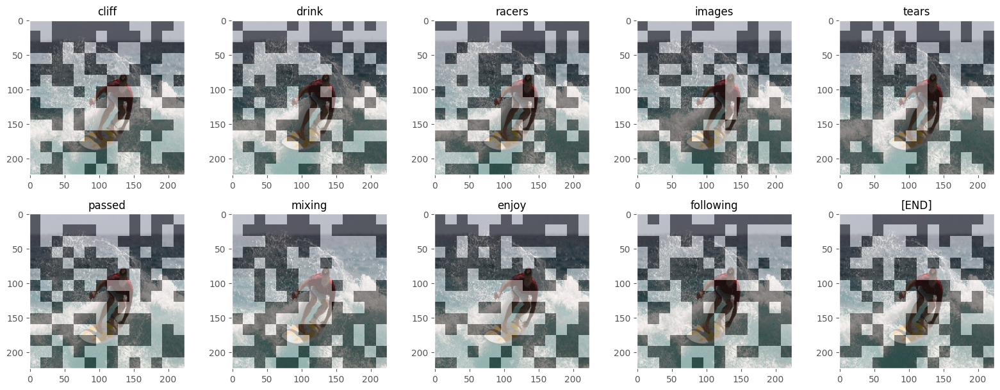

In [ ]:
str_tokens = caption.split()
attention_map = tf.random.uniform(shape=(10,14,14),minval=0,maxval=2,dtype=tf.int32).numpy()
plot_attention_maps(img.numpy().astype(np.uint8),str_tokens,attention_map)

## Callbacks

generate some captions during training at the end of each epoch

for the callback we'll be using this image

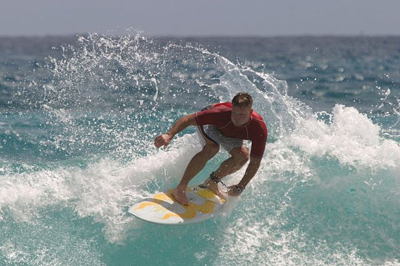

In [ ]:
Image.open(image_path).resize((400,266))

In [ ]:
class GenerateCaptionCallback(tf.keras.callbacks.Callback):
  """
   generate a caption for predifined image at the end of each epoch
  """
  def __init__(self,):
    super().__init__()

    image_url = 'https://tensorflow.org/images/surf.jpg'
    self.image_path = tf.keras.utils.get_file('surf.jpg', origin=image_url)
    self.img = tf.io.read_file(self.image_path)
    self.img = tf.io.decode_jpeg(self.img, channels=3)
    self.img = tf.image.resize(self.img, IMAGE_SHAPE[:-1])

  def on_epoch_end(self,epochs=None,logs=None):
    print('\n')
    for t in [0,0.5,1]:
      res = self.model.sample_gen(self.img,Temperature=t,verbose=None)
      print(res)
    print()

In [ ]:
G = GenerateCaptionCallback()
G.model = cap
G.on_epoch_end(epochs=0)



a a a a a a a a a a a a a
a a bubbles
a pool the ahead water dark a



## Train Model

In [ ]:
from tensorflow.keras.callbacks import TensorBoard
import datetime

### Losses and metrics


In [ ]:
def masked_loss(labels, preds):
  loss = tf.nn.sparse_softmax_cross_entropy_with_logits(labels, preds)

  mask = (labels != 0) & (loss < 1e8)
  mask = tf.cast(mask, loss.dtype)

  loss = loss*mask
  loss = tf.reduce_sum(loss)/tf.reduce_sum(mask)
  return loss

def masked_acc(labels, preds):
  mask = tf.cast(labels!=0, tf.float32)
  preds = tf.argmax(preds, axis=-1)
  labels = tf.cast(labels, tf.int64)
  match = tf.cast(preds == labels, mask.dtype)
  acc = tf.reduce_sum(match*mask)/tf.reduce_sum(mask)
  return acc

In [ ]:
cap = Captioner(vocab_size, tokenizer, d_model=256, max_positions=50, num_layers=1,
                key_dims=256, num_heads=1, dropout_rate=0.2)
G = GenerateCaptionCallback()

optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4)

!rm -rf ./logs/
log_dir = "logs/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=0)
callbacks = [
    G,
    tf.keras.callbacks.EarlyStopping(
        patience=5, restore_best_weights=True),
    tensorboard_callback]

In [ ]:
cap.compile(optimizer=optimizer,
           loss=masked_loss,
           metrics=[masked_acc])

In [ ]:
history = cap.fit(
    train_dataset.repeat(),
    steps_per_epoch=100,
    validation_data=test_dataset.repeat(),
    validation_steps=20,
    epochs=100,
    callbacks=callbacks
    )

Epoch 1/100
100/100 [==============================] - ETA: 0s - loss: 6.7302 - masked_acc: 0.1250

a a a a a a a a a a
a is on a
these toy boy in blond sitting a

100/100 [==============================] - 57s 371ms/step - loss: 6.7302 - masked_acc: 0.1250 - val_loss: 5.5511 - val_masked_acc: 0.1461
Epoch 2/100
100/100 [==============================] - ETA: 0s - loss: 5.2394 - masked_acc: 0.1954

a man in a a a man
a man man a yellow a trick
a auto all up suit trays everywhere with kick

100/100 [==============================] - 30s 299ms/step - loss: 5.2394 - masked_acc: 0.1954 - val_loss: 5.0029 - val_masked_acc: 0.2141
Epoch 3/100
100/100 [==============================] - ETA: 0s - loss: 4.7593 - masked_acc: 0.2471

a man in a red is is the the water
a girl in a stand
a dressed

100/100 [==============================] - 28s 279ms/step - loss: 4.7593 - masked_acc: 0.2471 - val_loss: 4.5808 - val_masked_acc: 0.2560
Epoch 4/100
100/100 [==============================] - ETA: 0s - 

In [ ]:
%load_ext tensorboard
%tensorboard --logdir logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
image_url = 'https://tensorflow.org/images/surf.jpg'
image_path = tf.keras.utils.get_file('surf.jpg', origin=image_url)
img = tf.io.read_file(image_path)
img = tf.io.decode_jpeg(img, channels=3)
img = tf.image.resize(img, IMAGE_SHAPE[:-1])

caption = cap.sample_gen(img,Temperature=0.5)
caption += ' [END]'
caption

..........

'a man is riding a surfboard in the ocean [END]'

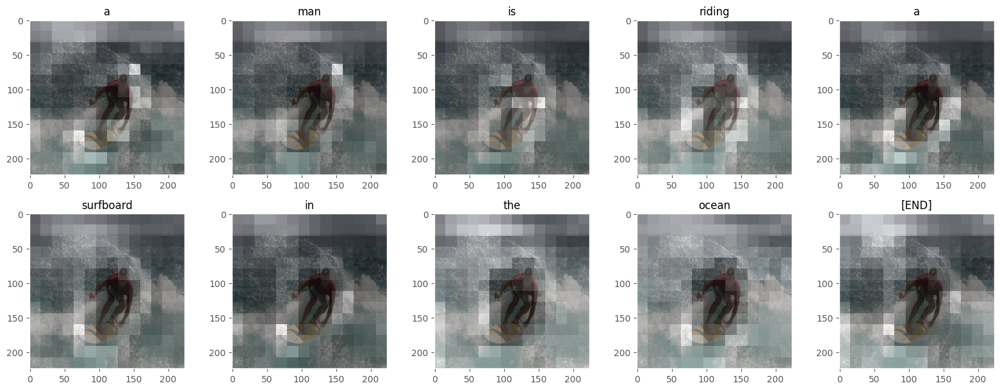

In [ ]:
str_tokens = caption.split()
attention_map = cap.dec_layers[-1].last_attention_scores
attention_map = tf.squeeze(attention_map)
attention_map = tf.reshape(attention_map,shape=[-1,14,14]).numpy()
plot_attention_maps(img.numpy().astype(np.uint8),str_tokens,attention_map)